In [1]:
from os import listdir
from os.path import isdir
from PIL import Image
from matplotlib import pyplot
from numpy import savez_compressed, asarray, load
from mtcnn.mtcnn import MTCNN
from keras.models import load_model
from sklearn.preprocessing import LabelEncoder, Normalizer
from numpy import linalg as la
from matplotlib import pyplot
import os
import numpy as np
import matplotlib.pyplot as plt

Using TensorFlow backend.
C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\tensorflow\python\framework\dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\tensorflow\python\framework\dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\lenovo\Anaconda3\envs\P

# 5-celebrities-faces-dataset 
# Default Settings

In [19]:
# Load dataset/model

data = np.load("5-celebrity-faces-dataset_2.npz")

raw_trainX, raw_trainy, raw_testX, raw_testy = data["arr_0"], data["arr_1"], data["arr_2"], data["arr_3"]
print("Loaded: ", raw_trainX.shape, raw_trainy.shape, raw_testX.shape, raw_testy.shape)

path_to_model = "keras-facenet/model/facenet_keras.h5"
model = load_model(path_to_model)

Loaded:  (93, 160, 160, 3) (93,) (25, 160, 160, 3) (25,)


C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\keras\engine\saving.py:341: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [20]:
from sklearn.preprocessing import Normalizer, LabelEncoder

# 1) Load dataset
data = np.load("5-celebrity-faces-embeddings.npz")
trainX, trainy, testX, testy = data["arr_0"], data["arr_1"], data["arr_2"], data["arr_3"]
print("Dataset: train=%d, test=%d" % (trainX.shape[0], testX.shape[0]))

# 2) Normalize input vectors
in_encoder = Normalizer(norm = "l2")
#print(trainX[0]) # Embedding without normalization
normed_trainX = in_encoder.transform(trainX)
#print(trainX[0]) # Embedding with normalization
normed_testX = in_encoder.transform(testX)

# 3) Label encode targets
out_encoder = LabelEncoder()
print(trainy)
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)
print(trainy)
testy = out_encoder.transform(testy)

Dataset: train=93, test=25
['ben_afflek' 'ben_afflek' 'ben_afflek' 'ben_afflek' 'ben_afflek'
 'ben_afflek' 'ben_afflek' 'ben_afflek' 'ben_afflek' 'ben_afflek'
 'ben_afflek' 'ben_afflek' 'ben_afflek' 'ben_afflek' 'elton_john'
 'elton_john' 'elton_john' 'elton_john' 'elton_john' 'elton_john'
 'elton_john' 'elton_john' 'elton_john' 'elton_john' 'elton_john'
 'elton_john' 'elton_john' 'elton_john' 'elton_john' 'elton_john'
 'elton_john' 'madonna' 'madonna' 'madonna' 'madonna' 'madonna' 'madonna'
 'madonna' 'madonna' 'madonna' 'madonna' 'madonna' 'madonna' 'madonna'
 'madonna' 'madonna' 'madonna' 'madonna' 'madonna' 'madonna'
 'jerry_seinfeld' 'jerry_seinfeld' 'jerry_seinfeld' 'jerry_seinfeld'
 'jerry_seinfeld' 'jerry_seinfeld' 'jerry_seinfeld' 'jerry_seinfeld'
 'jerry_seinfeld' 'jerry_seinfeld' 'jerry_seinfeld' 'jerry_seinfeld'
 'jerry_seinfeld' 'jerry_seinfeld' 'jerry_seinfeld' 'jerry_seinfeld'
 'jerry_seinfeld' 'jerry_seinfeld' 'jerry_seinfeld' 'jerry_seinfeld'
 'jerry_seinfeld' 'mindy_k

In [21]:
# Create embedding with it's own photo

count = 0
trainX2 = list()
for face in normed_trainX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    trainX2.append(new_emb)
    count += 1

count = 0
testX2 = list()
for face in normed_testX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    testX2.append(new_emb)
    count += 1 

# new_emb = [0.42, -0.11, ..., 0], [1.22, -2.11, ..., 24] 
# OBS: - the last number in the array (new_emb) is the index of the img in their raw dataset (the img dataset)

In [22]:
def metric_obtention(trainX2):
    how_many = len(trainX2) # how_many = 93

    # Formation of pairs (everyone with everyone)

    pairs = list() 
    # pairs = [ [img_i, img_j, label_i, label_j]   ] - img_i is the embedding of i

    for i in range(how_many):
        for j in range(i+1, how_many):
            pair = list()
            #print("(" + str(i) + "," + str(j) + ")")
            img_i = trainX2[i][0:-1]
            label_i = trainX2[i][-1]
            img_j = trainX2[j][0:-1]
            label_j = trainX2[j][-1]
            pair.append(img_i)
            pair.append(img_j)
            pair.append(label_i)
            pair.append(label_j)
            pairs.append(pair)

    # 2) Pair comparison

    
    threshold = np.linspace(0.1, 0.9, num=9, endpoint=True, retstep=False, dtype=float, axis=0)
    Psame = list()
    Pdiff = list()
    for t in range(len(threshold)):
        #print("Threshold: " + str(threshold[t]))
        for pair in pairs:
            norm = np.linalg.norm(pair[0] - pair[1])**2
            comparison = [pair[0], pair[1], pair[2], pair[3], norm]
            if norm < threshold[t]:
                Psame.append(comparison)
            else:
                Pdiff.append(comparison)
       
    # comparison = [img_i, img_j, label_i, label_j, norm]

    print("Pairs: " + str(len(pairs)))
    print("Psame: " + str(len(Psame)))
    print("Pdiff: " + str(len(Pdiff)))

    # 3) VAL and FAR rates

    VAL_list = []
    FAR_list = []
    TA_total = []
    FA_total = []
    for t in range(len(threshold)):
        TA = [] 
        FA = []
        fa_counter = 0
        ta_counter = 0
        for pair in Psame:
            if pair[-1] <= threshold[t]:
                TA.append(pair)
                ta_counter = len(TA)
                #print("TA para threshold:" + str(threshold[t]) + "es" + str(ta_counter))
                TA_total.append(TA)
        for pair in Pdiff:
            if pair[-1] <= threshold[t]:
                FA.append(pair)
                fa_counter = len(FA)
                #print("FA para threshold:" + str(threshold[t]) + "es" + str(fa_counter))
                TA_total.append(TA)
        if len(Psame) != 0:
            val = ta_counter/len(Psame)
        else:
            val = 0
        print("VAL para threshold:" + str(threshold[t]) + "es" + str(val))
        VAL_list.append(val)
        #print(VAL)
        if len(Pdiff) != 0:
            far = fa_counter/len(Pdiff)
        else:
            far = 0
        print("FAR para threshold:" + str(threshold[t]) + "es" + str(far))
        FAR_list.append(far)

    metrics = [pairs, Psame, Pdiff, TA_total, FA_total, VAL_list, FAR_list]
    return metrics

def face_pairs_plot(metrics_data, raw_imgs, how_many):
    for i in range(how_many):
        plt.figure()
        f, axarr = plt.subplots(1,2)
        axarr[0].imshow(raw_imgs[int(metrics_data[1][i][2])])
        axarr[1].imshow(raw_imgs[int(metrics_data[1][i][3])]) 
        # [1][i][2] means:
        # 1: Access Psame
        # i: Access the i-th term of Psame pairs
        # 2: Access the 2nd term of a single pair of Psame (which is the label of the img in the raw_imgs dataset)
    return

def ROC_plot(VAL, FAR):
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    #ax.xaxis.set_ticks_position('top')
    ax.yaxis.grid(linestyle = '-', color = 'gray')
    plt.xticks(fontsize=14,fontweight='normal')
    plt.yticks(fontsize=14,fontweight='normal')
    plt.xlabel('FAR', fontsize=14)
    plt.ylabel('VAL', fontsize=14)
    plt.xlim(0,0.015)
    plt.ylim(0,1)
    #ax.invert_xaxis()
    #ax.plot(FAR_list, VAL_list, 'g-', linewidth = 1.5)
    ax.plot(FAR, VAL, 'g-', linewidth = 1.5)
    #plt.show()
    return


Pairs: 4278
Psame: 1923
Pdiff: 36579
VAL para threshold:0.1es0.0046801872074883
FAR para threshold:0.1es0.0
VAL para threshold:0.2es0.021320852834113363
FAR para threshold:0.2es0.0001093523606440854
VAL para threshold:0.30000000000000004es0.09412376495059803
FAR para threshold:0.30000000000000004es0.0012028759670849394
VAL para threshold:0.4es0.359334373374935
FAR para threshold:0.4es0.008174088958145384
VAL para threshold:0.5es0.5725429017160687
FAR para threshold:0.5es0.017140982530960386
VAL para threshold:0.6es0.7410296411856474
FAR para threshold:0.6es0.028212909046174035
VAL para threshold:0.7000000000000001es0.8611544461778471
FAR para threshold:0.7000000000000001es0.0408431067005659
VAL para threshold:0.8es0.9547581903276131
FAR para threshold:0.8es0.05806610350200935
VAL para threshold:0.9es1.0
FAR para threshold:0.9es0.07709341425408021
---------------------
[0.0, 0.0001093523606440854, 0.0012028759670849394, 0.008174088958145384, 0.017140982530960386, 0.028212909046174035, 0

<Figure size 432x288 with 0 Axes>

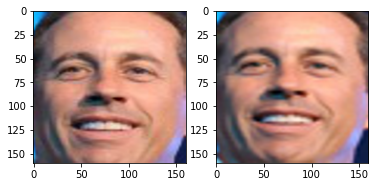

<Figure size 432x288 with 0 Axes>

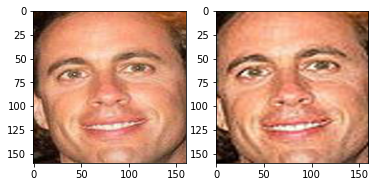

<Figure size 432x288 with 0 Axes>

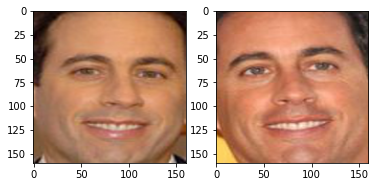

<Figure size 432x288 with 0 Axes>

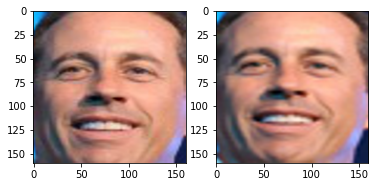

<Figure size 432x288 with 0 Axes>

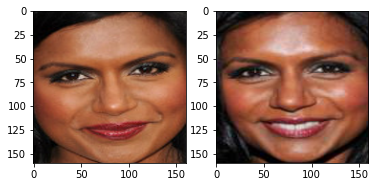

<Figure size 432x288 with 0 Axes>

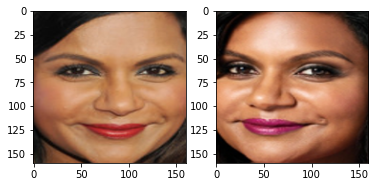

<Figure size 432x288 with 0 Axes>

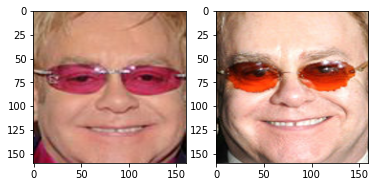

<Figure size 432x288 with 0 Axes>

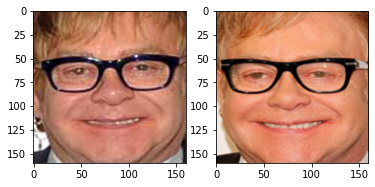

<Figure size 432x288 with 0 Axes>

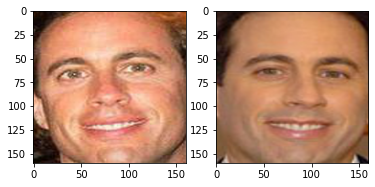

<Figure size 432x288 with 0 Axes>

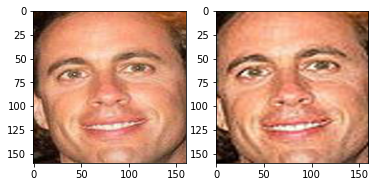

In [23]:
first_iteration = metric_obtention(trainX2)

print("---------------------")


print(first_iteration[-1])
print(first_iteration[-2])
    
face_pairs_plot(first_iteration, raw_trainX, 10)

print("EXAMPLE PLOT")

Pairs: 300
Psame: 162
Pdiff: 2538
VAL para threshold:0.1es0.0
FAR para threshold:0.1es0.0
VAL para threshold:0.2es0.0
FAR para threshold:0.2es0.0
VAL para threshold:0.30000000000000004es0.1728395061728395
FAR para threshold:0.30000000000000004es0.0031520882584712374
VAL para threshold:0.4es0.32098765432098764
FAR para threshold:0.4es0.007880220646178092
VAL para threshold:0.5es0.6296296296296297
FAR para threshold:0.5es0.02364066193853428
VAL para threshold:0.6es0.7777777777777778
FAR para threshold:0.6es0.03546099290780142
VAL para threshold:0.7000000000000001es0.9259259259259259
FAR para threshold:0.7000000000000001es0.054373522458628844
VAL para threshold:0.8es0.9629629629629629
FAR para threshold:0.8es0.06264775413711583
VAL para threshold:0.9es1.0
FAR para threshold:0.9es0.08156028368794327
---------------------
[0.0, 0.0, 0.0031520882584712374, 0.007880220646178092, 0.02364066193853428, 0.03546099290780142, 0.054373522458628844, 0.06264775413711583, 0.08156028368794327]
[0.0, 0.0

<Figure size 432x288 with 0 Axes>

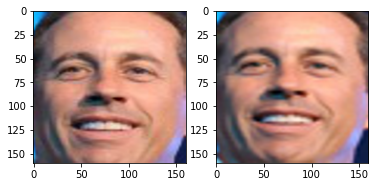

<Figure size 432x288 with 0 Axes>

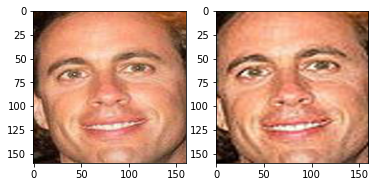

<Figure size 432x288 with 0 Axes>

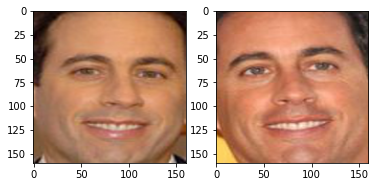

<Figure size 432x288 with 0 Axes>

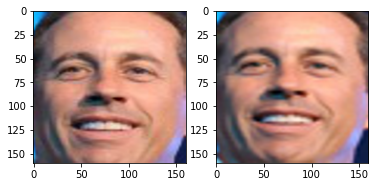

<Figure size 432x288 with 0 Axes>

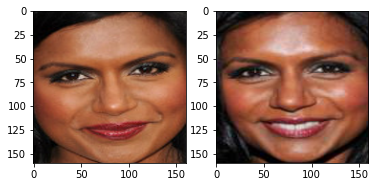

<Figure size 432x288 with 0 Axes>

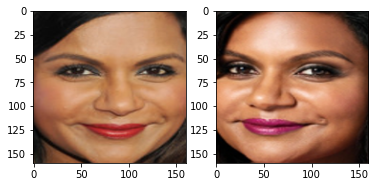

<Figure size 432x288 with 0 Axes>

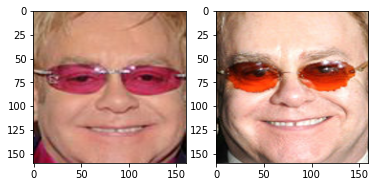

<Figure size 432x288 with 0 Axes>

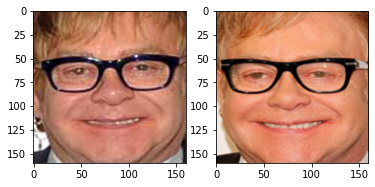

<Figure size 432x288 with 0 Axes>

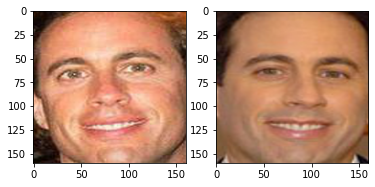

<Figure size 432x288 with 0 Axes>

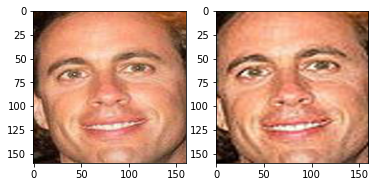

In [24]:
second_iteration = metric_obtention(testX2)

print("---------------------")


print(second_iteration[-1])
print(second_iteration[-2])
    
face_pairs_plot(first_iteration, raw_trainX, 10)

print("EXAMPLE PLOT")

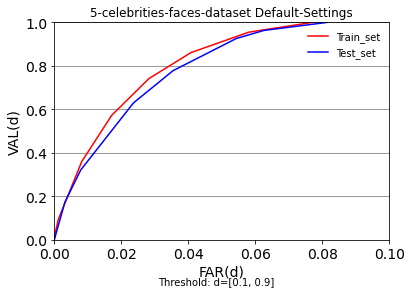

In [25]:
# Plotting train vs test metrics

x = first_iteration[-1]
y = first_iteration[-2]
u = second_iteration[-1]
v = second_iteration[-2]

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
#ax.xaxis.set_ticks_position('top')
plt.title('5-celebrities-faces-dataset Default-Settings')
plt.suptitle('Threshold: d=[0.1, 0.9]',fontsize=10, y=0)
ax.yaxis.grid(linestyle = '-', color = 'gray')
plt.xticks(fontsize=14,fontweight='normal')
plt.yticks(fontsize=14,fontweight='normal')
plt.xlabel('FAR(d)', fontsize=14)
plt.ylabel('VAL(d)', fontsize=14)
plt.xlim(0,0.1)
plt.ylim(0,1)
#ax.invert_xaxis()
ax.plot(x, y, 'g-', linewidth = 1.5, color='red', label='Train_set')
ax.plot(u, v, 'g-', linewidth = 1.5, color='blue', label='Test_set')
ax.legend(loc='upper right', frameon=False)
plt.savefig('Resultados/5-celebrities-faces-dataset Default-Settings.png')
plt.show()



# Changing to MaxPooling

In [28]:
from sklearn.preprocessing import Normalizer, LabelEncoder

# 1) Load dataset
data = np.load("embeddings/5-celebs/train/maxpool-5-celebrity-faces-dataset-norm.npz")
trainX, trainy, testX, testy = data["arr_0"], data["arr_1"], data["arr_2"], data["arr_3"]
print("Dataset: train=%d, test=%d" % (trainX.shape[0], testX.shape[0]))

# 2) Normalize input vectors
in_encoder = Normalizer(norm = "l2")
#print(trainX[0]) # Embedding without normalization
normed_trainX = in_encoder.transform(trainX)
#print(trainX[0]) # Embedding with normalization
normed_testX = in_encoder.transform(testX)

# 3) Label encode targets
out_encoder = LabelEncoder()
#print(trainy)
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)
#print(trainy)
testy = out_encoder.transform(testy)

Dataset: train=93, test=25


In [29]:
# Create embedding with it's own photo

count = 0
trainX2_max = list()
for face in normed_trainX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    trainX2_max.append(new_emb)
    count += 1

count = 0
testX2_max = list()
for face in normed_testX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    testX2_max.append(new_emb)
    count += 1 

# new_emb = [0.42, -0.11, ..., 0], [1.22, -2.11, ..., 24] 
# OBS: - the last number in the array (new_emb) is the index of the img in their raw dataset (the img dataset)

Pairs: 4278
Psame: 2394
Pdiff: 36108
VAL para threshold:0.1es0.0037593984962406013
FAR para threshold:0.1es0.0
VAL para threshold:0.2es0.027151211361737676
FAR para threshold:0.2es0.000193862855876814
VAL para threshold:0.30000000000000004es0.13826232247284878
FAR para threshold:0.30000000000000004es0.0022986595768250805
VAL para threshold:0.4es0.3888888888888889
FAR para threshold:0.4es0.010607067685831395
VAL para threshold:0.5es0.5852130325814536
FAR para threshold:0.5es0.021020272515785976
VAL para threshold:0.6es0.752297410192147
FAR para threshold:0.6es0.03486761936412983
VAL para threshold:0.7000000000000001es0.8801169590643275
FAR para threshold:0.7000000000000001es0.05181677190650271
VAL para threshold:0.8es0.968671679197995
FAR para threshold:0.8es0.072366234629445
VAL para threshold:0.9es1.0
FAR para threshold:0.9es0.08898305084745763
---------------------
[0.0, 0.000193862855876814, 0.0022986595768250805, 0.010607067685831395, 0.021020272515785976, 0.03486761936412983, 0.05

<Figure size 432x288 with 0 Axes>

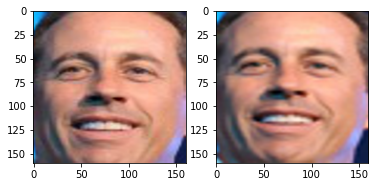

<Figure size 432x288 with 0 Axes>

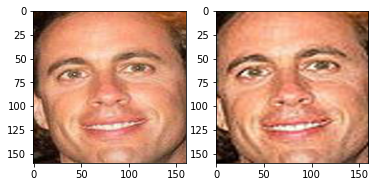

<Figure size 432x288 with 0 Axes>

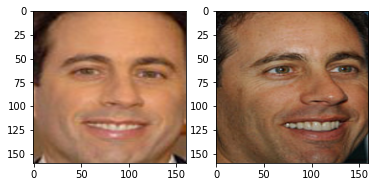

<Figure size 432x288 with 0 Axes>

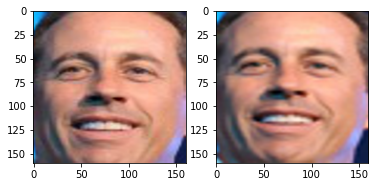

<Figure size 432x288 with 0 Axes>

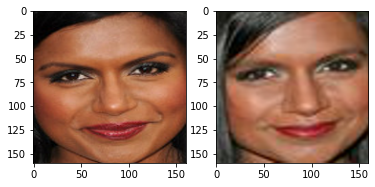

<Figure size 432x288 with 0 Axes>

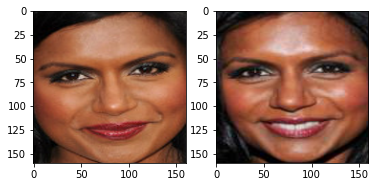

<Figure size 432x288 with 0 Axes>

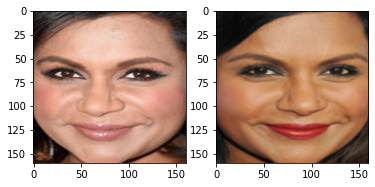

<Figure size 432x288 with 0 Axes>

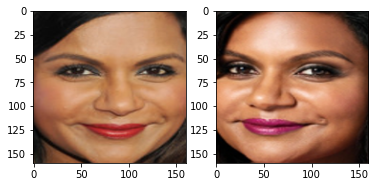

<Figure size 432x288 with 0 Axes>

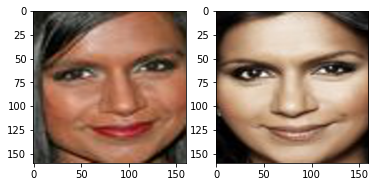

<Figure size 432x288 with 0 Axes>

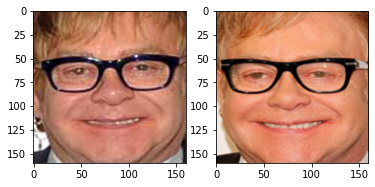

In [30]:
max_first_iteration = metric_obtention(trainX2_max)

print("---------------------")


print(max_first_iteration[-1])
print(max_first_iteration[-2])
    
face_pairs_plot(max_first_iteration, raw_trainX, 10)

print("EXAMPLE PLOT")

Pairs: 300
Psame: 186
Pdiff: 2514
VAL para threshold:0.1es0.0
FAR para threshold:0.1es0.0
VAL para threshold:0.2es0.08602150537634409
FAR para threshold:0.2es0.0007955449482895784
VAL para threshold:0.30000000000000004es0.16129032258064516
FAR para threshold:0.30000000000000004es0.002386634844868735
VAL para threshold:0.4es0.3870967741935484
FAR para threshold:0.4es0.010739856801909307
VAL para threshold:0.5es0.6021505376344086
FAR para threshold:0.5es0.023468575974542563
VAL para threshold:0.6es0.7956989247311828
FAR para threshold:0.6es0.04136833731105807
VAL para threshold:0.7000000000000001es0.8924731182795699
FAR para threshold:0.7000000000000001es0.05568814638027048
VAL para threshold:0.8es0.989247311827957
FAR para threshold:0.8es0.0807478122513922
VAL para threshold:0.9es1.0
FAR para threshold:0.9es0.08711217183770883
---------------------
[0.0, 0.0007955449482895784, 0.002386634844868735, 0.010739856801909307, 0.023468575974542563, 0.04136833731105807, 0.05568814638027048, 0.0

<Figure size 432x288 with 0 Axes>

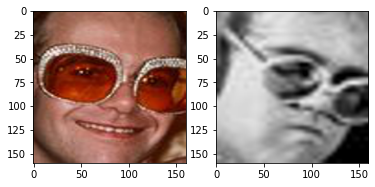

<Figure size 432x288 with 0 Axes>

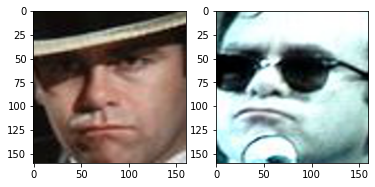

<Figure size 432x288 with 0 Axes>

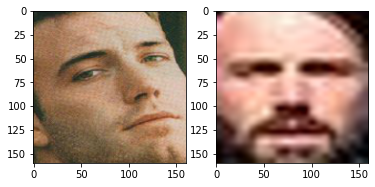

<Figure size 432x288 with 0 Axes>

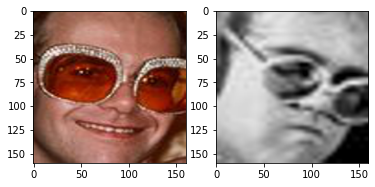

<Figure size 432x288 with 0 Axes>

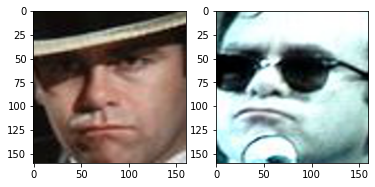

<Figure size 432x288 with 0 Axes>

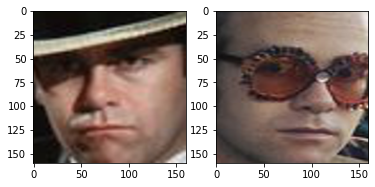

<Figure size 432x288 with 0 Axes>

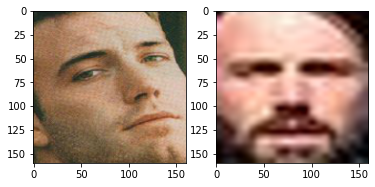

<Figure size 432x288 with 0 Axes>

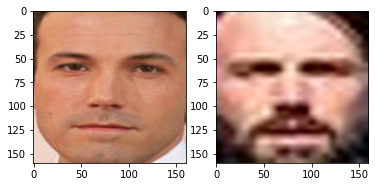

<Figure size 432x288 with 0 Axes>

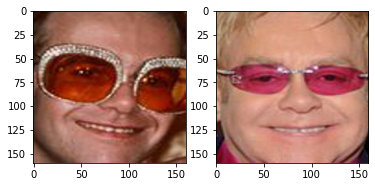

<Figure size 432x288 with 0 Axes>

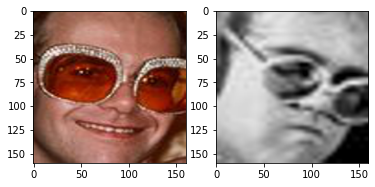

In [31]:
max_second_iteration = metric_obtention(testX2_max)

print("---------------------")


print(max_second_iteration[-1])
print(max_second_iteration[-2])
    
face_pairs_plot(max_second_iteration, raw_trainX, 10)

print("EXAMPLE PLOT")

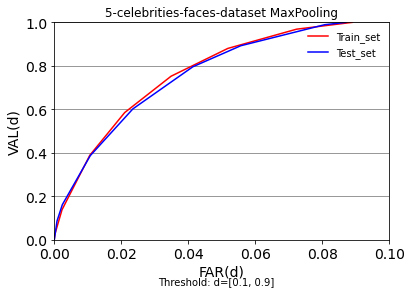

In [32]:
# Plotting train vs test metrics

x_max = max_first_iteration[-1]
y_max = max_first_iteration[-2]
u_max = max_second_iteration[-1]
v_max = max_second_iteration[-2]

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
#ax.xaxis.set_ticks_position('top')
plt.title('5-celebrities-faces-dataset MaxPooling')
plt.suptitle('Threshold: d=[0.1, 0.9]',fontsize=10, y=0)
ax.yaxis.grid(linestyle = '-', color = 'gray')
plt.xticks(fontsize=14,fontweight='normal')
plt.yticks(fontsize=14,fontweight='normal')
plt.xlabel('FAR(d)', fontsize=14)
plt.ylabel('VAL(d)', fontsize=14)
plt.xlim(0,0.1)
plt.ylim(0,1)
#ax.invert_xaxis()
ax.plot(x_max, y_max, 'g-', linewidth = 1.5, color='red', label='Train_set')
ax.plot(u_max, v_max, 'g-', linewidth = 1.5, color='blue', label='Test_set')
ax.legend(loc='upper right', frameon=False)
plt.savefig('Resultados/5-celebrities-faces-dataset MaxPooling.png')
plt.show()

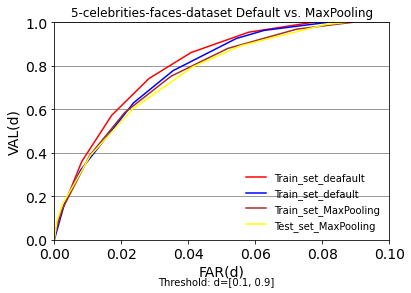

In [33]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
#ax.xaxis.set_ticks_position('top')
plt.title('5-celebrities-faces-dataset Default vs. MaxPooling')
plt.suptitle('Threshold: d=[0.1, 0.9]',fontsize=10, y=0)
ax.yaxis.grid(linestyle = '-', color = 'gray')
plt.xticks(fontsize=14,fontweight='normal')
plt.yticks(fontsize=14,fontweight='normal')
plt.xlabel('FAR(d)', fontsize=14)
plt.ylabel('VAL(d)', fontsize=14)
plt.xlim(0,0.1)
plt.ylim(0,1)
#ax.invert_xaxis()
ax.plot(x, y, 'g-', linewidth = 1.5, color='red', label='Train_set_deafault')
ax.plot(u, v, 'g-', linewidth = 1.5, color='blue', label='Train_set_default')
ax.plot(x_max, y_max, 'g-', linewidth = 1.5, color='brown', label='Train_set_MaxPooling')
ax.plot(u_max, v_max, 'g-', linewidth = 1.5, color='yellow', label='Test_set_MaxPooling')
ax.legend(loc='lower right', frameon=False)
plt.savefig('Resultados/5-celebrities-faces-dataset Default vs MaxPooling.png')
plt.show()

# 5-celebrities-faces-dataset with outliers

In [34]:
# Load dataset/model

data = np.load("5_celebs_outliers.npz")

raw_trainX, raw_trainy, raw_testX, raw_testy = data["arr_0"], data["arr_1"], data["arr_2"], data["arr_3"]
print("Loaded: ", raw_trainX.shape, raw_trainy.shape, raw_testX.shape, raw_testy.shape)

path_to_model = "keras-facenet/model/facenet_keras.h5"
model = load_model(path_to_model)

Loaded:  (100, 160, 160, 3) (100,) (38, 160, 160, 3) (38,)


C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\keras\engine\saving.py:341: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [35]:
from sklearn.preprocessing import Normalizer, LabelEncoder

# 1) Load dataset
data = np.load("5_celebs_outliers_embeddings.npz")
trainX, trainy, testX, testy = data["arr_0"], data["arr_1"], data["arr_2"], data["arr_3"]
print("Dataset: train=%d, test=%d" % (trainX.shape[0], testX.shape[0]))

# 2) Normalize input vectors
in_encoder = Normalizer(norm = "l2")
#print(trainX[0]) # Embedding without normalization
normed_trainX = in_encoder.transform(trainX)
#print(trainX[0]) # Embedding with normalization
normed_testX = in_encoder.transform(testX)

# 3) Label encode targets
out_encoder = LabelEncoder()
#print(trainy)
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)
#print(trainy)
testy = out_encoder.transform(testy)

Dataset: train=100, test=38


Pairs: 4950
Psame: 2230
Pdiff: 42320
VAL para threshold:0.1es0.03228699551569507
FAR para threshold:0.1es0.0
VAL para threshold:0.2es0.05022421524663677
FAR para threshold:0.2es0.00011814744801512288
VAL para threshold:0.30000000000000004es0.12242152466367713
FAR para threshold:0.30000000000000004es0.0012051039697542534
VAL para threshold:0.4es0.39417040358744393
FAR para threshold:0.4es0.008364839319470699
VAL para threshold:0.5es0.589237668161435
FAR para threshold:0.5es0.01658790170132325
VAL para threshold:0.6es0.7452914798206278
FAR para threshold:0.6es0.026866729678638943
VAL para threshold:0.7000000000000001es0.8623318385650224
FAR para threshold:0.7000000000000001es0.03920132325141777
VAL para threshold:0.8es0.9556053811659193
FAR para threshold:0.8es0.05640359168241966
VAL para threshold:0.9es1.0
FAR para threshold:0.9es0.07511814744801512
---------------------
[0.0, 0.00011814744801512288, 0.0012051039697542534, 0.008364839319470699, 0.01658790170132325, 0.026866729678638943,

<Figure size 432x288 with 0 Axes>

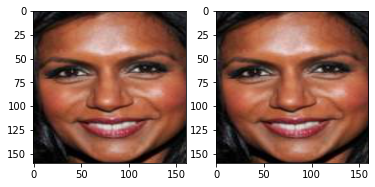

<Figure size 432x288 with 0 Axes>

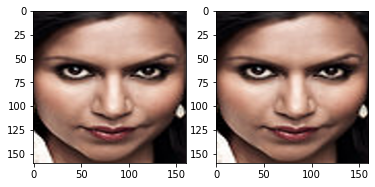

<Figure size 432x288 with 0 Axes>

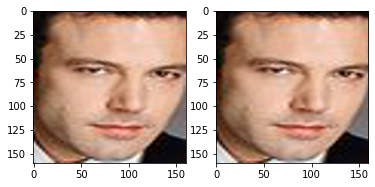

<Figure size 432x288 with 0 Axes>

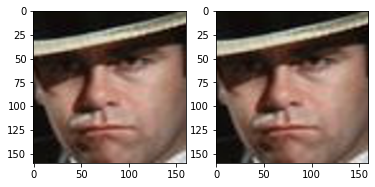

<Figure size 432x288 with 0 Axes>

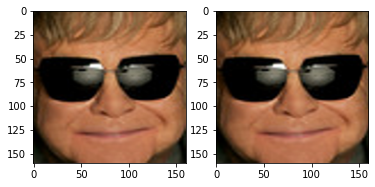

<Figure size 432x288 with 0 Axes>

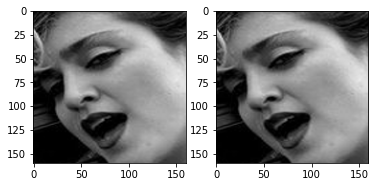

<Figure size 432x288 with 0 Axes>

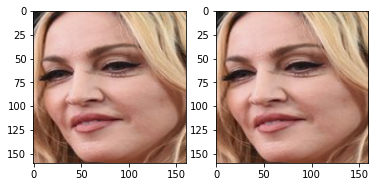

<Figure size 432x288 with 0 Axes>

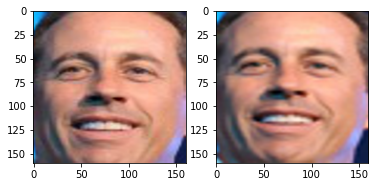

<Figure size 432x288 with 0 Axes>

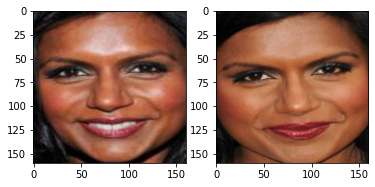

<Figure size 432x288 with 0 Axes>

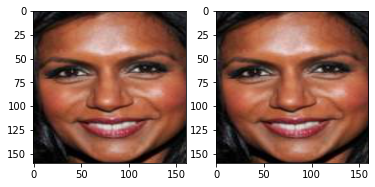

In [36]:
count = 0
trainX2_outl = list()
for face in normed_trainX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    trainX2_outl.append(new_emb)
    count += 1

count = 0
testX2_outl = list()
for face in normed_testX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    testX2_outl.append(new_emb)
    count += 1 

# new_emb = [0.42, -0.11, ..., 0], [1.22, -2.11, ..., 24] 
# OBS: - the last number in the array (new_emb) is the index of the img in their raw dataset (the img dataset)

outl_first_iteration = metric_obtention(trainX2_outl)

print("---------------------")


print(outl_first_iteration[-1])
print(outl_first_iteration[-2])
    
face_pairs_plot(outl_first_iteration, raw_trainX, 10)

print("EXAMPLE PLOT")


In [37]:
outl_second_iteration = metric_obtention(testX2_outl)

print("---------------------")


print(outl_second_iteration[-1])
print(outl_second_iteration[-2])
    
#face_pairs_plot(outl_second_iteration, raw_trainX, 10)

#print("EXAMPLE PLOT")

Pairs: 703
Psame: 266
Pdiff: 6061
VAL para threshold:0.1es0.16917293233082706
FAR para threshold:0.1es0.0
VAL para threshold:0.2es0.16917293233082706
FAR para threshold:0.2es0.0
VAL para threshold:0.30000000000000004es0.2744360902255639
FAR para threshold:0.30000000000000004es0.0013199142055766375
VAL para threshold:0.4es0.4323308270676692
FAR para threshold:0.4es0.004784688995215311
VAL para threshold:0.5es0.7142857142857143
FAR para threshold:0.5es0.014684045537040093
VAL para threshold:0.6es0.8045112781954887
FAR para threshold:0.6es0.01963372380795248
VAL para threshold:0.7000000000000001es0.9511278195488722
FAR para threshold:0.7000000000000001es0.0325028873123247
VAL para threshold:0.8es0.9736842105263158
FAR para threshold:0.8es0.03596766210196337
VAL para threshold:0.9es1.0
FAR para threshold:0.9es0.045207061540999835
---------------------
[0.0, 0.0, 0.0013199142055766375, 0.004784688995215311, 0.014684045537040093, 0.01963372380795248, 0.0325028873123247, 0.03596766210196337, 

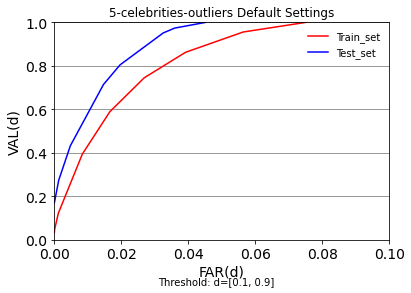

In [38]:
x_outl = outl_first_iteration[-1]
y_outl = outl_first_iteration[-2]
u_outl = outl_second_iteration[-1]
v_outl = outl_second_iteration[-2]

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
#ax.xaxis.set_ticks_position('top')
plt.title('5-celebrities-outliers Default Settings')
plt.suptitle('Threshold: d=[0.1, 0.9]',fontsize=10, y=0)
ax.yaxis.grid(linestyle = '-', color = 'gray')
plt.xticks(fontsize=14,fontweight='normal')
plt.yticks(fontsize=14,fontweight='normal')
plt.xlabel('FAR(d)', fontsize=14)
plt.ylabel('VAL(d)', fontsize=14)
plt.xlim(0,0.1)
plt.ylim(0,1)
#ax.invert_xaxis()
ax.plot(x_outl, y_outl, 'g-', linewidth = 1.5, color='red', label='Train_set')
ax.plot(u_outl, v_outl, 'g-', linewidth = 1.5, color='blue', label='Test_set')
ax.legend(loc='upper right', frameon=False)
plt.savefig('Resultados/5-celebrities-outliers Default Settings.png')
plt.show()

# 5-celebrites-outliers MaxPooling

In [25]:
from sklearn.preprocessing import Normalizer, LabelEncoder

# 1) Load dataset
data = np.load("embeddings/outliers/train/maxpool_5_celebs_outliers_norm.npz")
trainX, trainy, testX, testy = data["arr_0"], data["arr_1"], data["arr_2"], data["arr_3"]
print("Dataset: train=%d, test=%d" % (trainX.shape[0], testX.shape[0]))

# 2) Normalize input vectors
in_encoder = Normalizer(norm = "l2")
#print(trainX[0]) # Embedding without normalization
normed_trainX = in_encoder.transform(trainX)
#print(trainX[0]) # Embedding with normalization
normed_testX = in_encoder.transform(testX)

# 3) Label encode targets
out_encoder = LabelEncoder()
#print(trainy)
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)
#print(trainy)
testy = out_encoder.transform(testy)

Dataset: train=100, test=38


Pairs: 4950
Psame: 2230
Pdiff: 42320
VAL para threshold:0.1es0.03228699551569507
FAR para threshold:0.1es0.0
VAL para threshold:0.2es0.05022421524663677
FAR para threshold:0.2es0.00011814744801512288
VAL para threshold:0.30000000000000004es0.12242152466367713
FAR para threshold:0.30000000000000004es0.0012051039697542534
VAL para threshold:0.4es0.39417040358744393
FAR para threshold:0.4es0.008364839319470699
VAL para threshold:0.5es0.589237668161435
FAR para threshold:0.5es0.01658790170132325
VAL para threshold:0.6es0.7452914798206278
FAR para threshold:0.6es0.026866729678638943
VAL para threshold:0.7000000000000001es0.8623318385650224
FAR para threshold:0.7000000000000001es0.03920132325141777
VAL para threshold:0.8es0.9556053811659193
FAR para threshold:0.8es0.05640359168241966
VAL para threshold:0.9es1.0
FAR para threshold:0.9es0.07511814744801512
---------------------
[0.0, 0.00011814744801512288, 0.0012051039697542534, 0.008364839319470699, 0.01658790170132325, 0.026866729678638943,

C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\ipykernel_launcher.py:87: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\ipykernel_launcher.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


EXAMPLE PLOT


<Figure size 432x288 with 0 Axes>

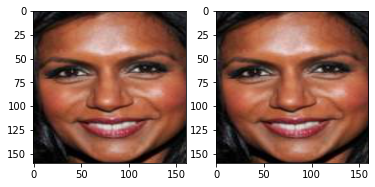

<Figure size 432x288 with 0 Axes>

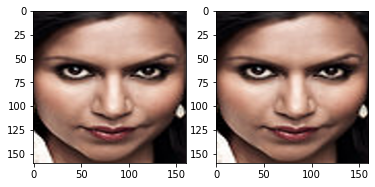

<Figure size 432x288 with 0 Axes>

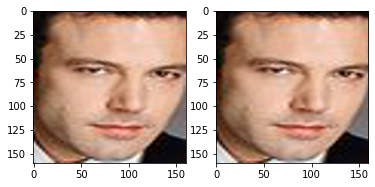

<Figure size 432x288 with 0 Axes>

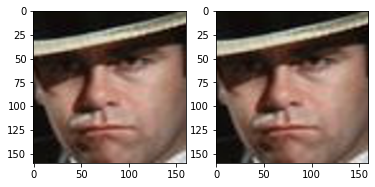

<Figure size 432x288 with 0 Axes>

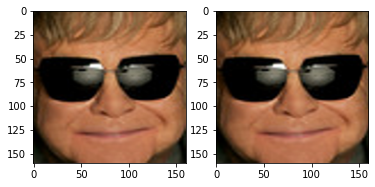

<Figure size 432x288 with 0 Axes>

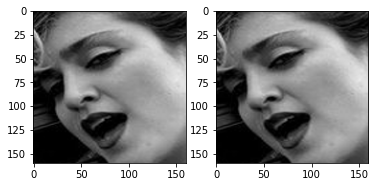

<Figure size 432x288 with 0 Axes>

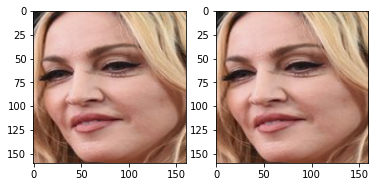

<Figure size 432x288 with 0 Axes>

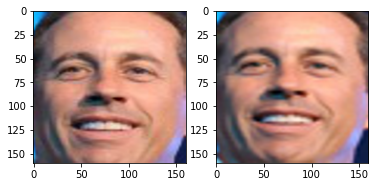

<Figure size 432x288 with 0 Axes>

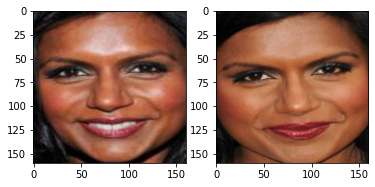

<Figure size 432x288 with 0 Axes>

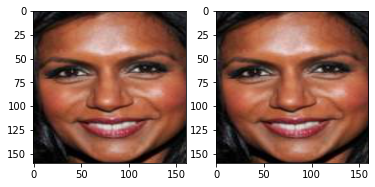

<Figure size 432x288 with 0 Axes>

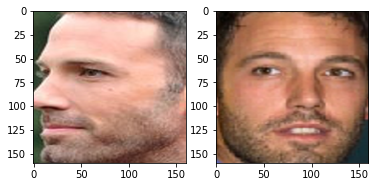

<Figure size 432x288 with 0 Axes>

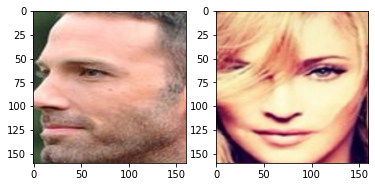

<Figure size 432x288 with 0 Axes>

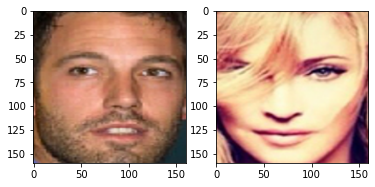

<Figure size 432x288 with 0 Axes>

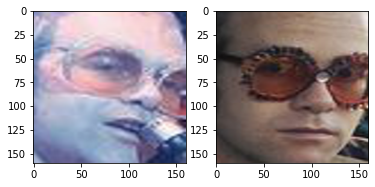

<Figure size 432x288 with 0 Axes>

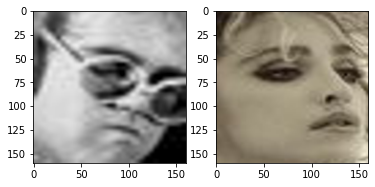

<Figure size 432x288 with 0 Axes>

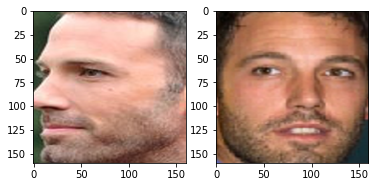

<Figure size 432x288 with 0 Axes>

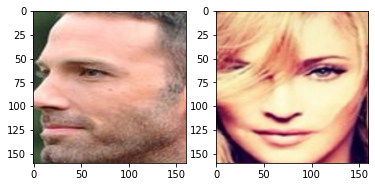

<Figure size 432x288 with 0 Axes>

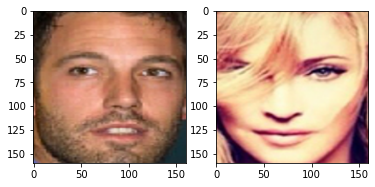

<Figure size 432x288 with 0 Axes>

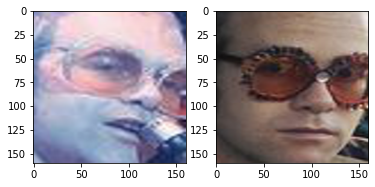

<Figure size 432x288 with 0 Axes>

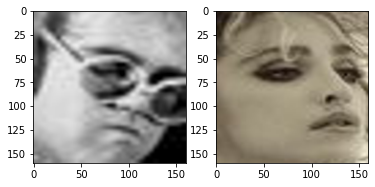

In [39]:
count = 0
trainX2_outl_max = list()
for face in normed_trainX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    trainX2_outl_max.append(new_emb)
    count += 1

count = 0
testX2_outl_max = list()
for face in normed_testX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    testX2_outl_max.append(new_emb)
    count += 1 

# new_emb = [0.42, -0.11, ..., 0], [1.22, -2.11, ..., 24] 
# OBS: - the last number in the array (new_emb) is the index of the img in their raw dataset (the img dataset)

max_outl_first_iteration = metric_obtention(trainX2_outl_max)

print("---------------------")


print(max_outl_first_iteration[-1])
print(max_outl_first_iteration[-2])
    
face_pairs_plot(max_outl_first_iteration, raw_trainX, 10)

print("EXAMPLE PLOT")

max_outl_second_iteration = metric_obtention(testX2_outl_max)

print("---------------------")


print(max_outl_second_iteration[-1])
print(max_outl_second_iteration[-2])
    
face_pairs_plot(max_outl_second_iteration, raw_trainX, 10)

print("EXAMPLE PLOT")



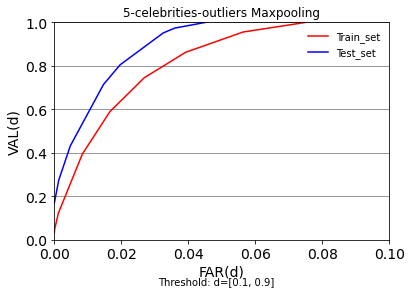

In [40]:
x_outl_max = max_outl_first_iteration[-1]
y_outl_max = max_outl_first_iteration[-2]
u_outl_max = max_outl_second_iteration[-1]
v_outl_max = max_outl_second_iteration[-2]

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
#ax.xaxis.set_ticks_position('top')
plt.title('5-celebrities-outliers Maxpooling')
plt.suptitle('Threshold: d=[0.1, 0.9]',fontsize=10, y=0)
ax.yaxis.grid(linestyle = '-', color = 'gray')
plt.xticks(fontsize=14,fontweight='normal')
plt.yticks(fontsize=14,fontweight='normal')
plt.xlabel('FAR(d)', fontsize=14)
plt.ylabel('VAL(d)', fontsize=14)
plt.xlim(0,0.1)
plt.ylim(0,1)
#ax.invert_xaxis()
ax.plot(x_outl_max, y_outl_max, 'g-', linewidth = 1.5, color='red', label='Train_set')
ax.plot(u_outl_max, v_outl_max, 'g-', linewidth = 1.5, color='blue', label='Test_set')
ax.legend(loc='upper right', frameon=False)
plt.savefig('Resultados/5-celebrities-outliers MaxPooling.png')
plt.show()

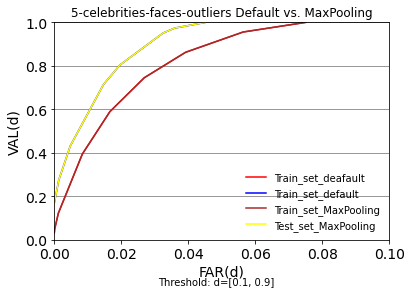

In [41]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
#ax.xaxis.set_ticks_position('top')
plt.title('5-celebrities-faces-outliers Default vs. MaxPooling')
plt.suptitle('Threshold: d=[0.1, 0.9]',fontsize=10, y=0)
ax.yaxis.grid(linestyle = '-', color = 'gray')
plt.xticks(fontsize=14,fontweight='normal')
plt.yticks(fontsize=14,fontweight='normal')
plt.xlabel('FAR(d)', fontsize=14)
plt.ylabel('VAL(d)', fontsize=14)
plt.xlim(0,0.1)
plt.ylim(0,1)
#ax.invert_xaxis()
ax.plot(x_outl, y_outl, 'g-', linewidth = 1.5, color='red', label='Train_set_deafault')
ax.plot(u_outl, v_outl, 'g-', linewidth = 1.5, color='blue', label='Train_set_default')
ax.plot(x_outl_max, y_outl_max, 'g-', linewidth = 1.5, color='brown', label='Train_set_MaxPooling')
ax.plot(u_outl_max, v_outl_max, 'g-', linewidth = 1.5, color='yellow', label='Test_set_MaxPooling')
ax.legend(loc='lower right', frameon=False)
plt.savefig('Resultados/5-celebrities-faces-outliers Default vs MaxPooling.png')
plt.show()

# 5-celebrities-formats Default Settings

In [42]:
# Load dataset/model

data = np.load("5_celebs_format.npz")

raw_trainX, raw_trainy, raw_testX, raw_testy = data["arr_0"], data["arr_1"], data["arr_2"], data["arr_3"]
print("Loaded: ", raw_trainX.shape, raw_trainy.shape, raw_testX.shape, raw_testy.shape)

path_to_model = "keras-facenet/model/facenet_keras.h5"
model = load_model(path_to_model)

Loaded:  (100, 160, 160, 3) (100,) (26, 160, 160, 3) (26,)


C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\keras\engine\saving.py:341: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [43]:
from sklearn.preprocessing import Normalizer, LabelEncoder

# 1) Load dataset
data = np.load("5_celebs_format_embeddings.npz")
trainX, trainy, testX, testy = data["arr_0"], data["arr_1"], data["arr_2"], data["arr_3"]
print("Dataset: train=%d, test=%d" % (trainX.shape[0], testX.shape[0]))

# 2) Normalize input vectors
in_encoder = Normalizer(norm = "l2")
#print(trainX[0]) # Embedding without normalization
normed_trainX = in_encoder.transform(trainX)
#print(trainX[0]) # Embedding with normalization
normed_testX = in_encoder.transform(testX)

# 3) Label encode targets
out_encoder = LabelEncoder()
#print(trainy)
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)
#print(trainy)
testy = out_encoder.transform(testy)

Dataset: train=100, test=26


Pairs: 4950
Psame: 2494
Pdiff: 42056
VAL para threshold:0.1es0.057738572574178026
FAR para threshold:0.1es0.0
VAL para threshold:0.2es0.07056936647955092
FAR para threshold:0.2es9.511128019783147e-05
VAL para threshold:0.30000000000000004es0.16038492381716118
FAR para threshold:0.30000000000000004es0.001616891763363135
VAL para threshold:0.4es0.41780272654370487
FAR para threshold:0.4es0.00924957199923911
VAL para threshold:0.5es0.6202886928628709
FAR para threshold:0.5es0.018855811299220086
VAL para threshold:0.6es0.7806736166800321
FAR para threshold:0.6es0.03074472132394902
VAL para threshold:0.7000000000000001es0.8744987971130713
FAR para threshold:0.7000000000000001es0.0418727411070953
VAL para threshold:0.8es0.958700882117081
FAR para threshold:0.8es0.05934943884344683
VAL para threshold:0.9es1.0
FAR para threshold:0.9es0.07894236256420012
---------------------
[0.0, 9.511128019783147e-05, 0.001616891763363135, 0.00924957199923911, 0.018855811299220086, 0.03074472132394902, 0.041

C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\ipykernel_launcher.py:87: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\ipykernel_launcher.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


EXAMPLE PLOT


<Figure size 432x288 with 0 Axes>

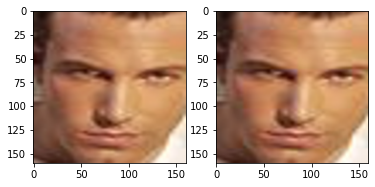

<Figure size 432x288 with 0 Axes>

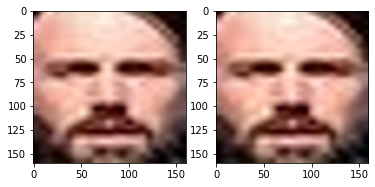

<Figure size 432x288 with 0 Axes>

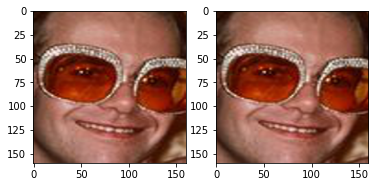

<Figure size 432x288 with 0 Axes>

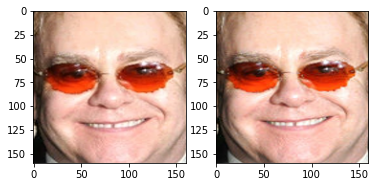

<Figure size 432x288 with 0 Axes>

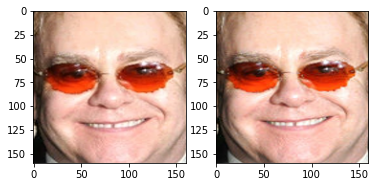

<Figure size 432x288 with 0 Axes>

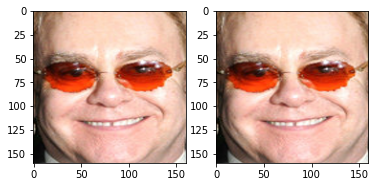

<Figure size 432x288 with 0 Axes>

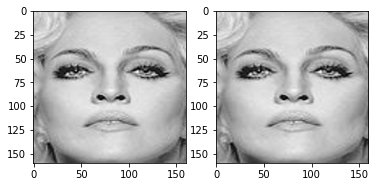

<Figure size 432x288 with 0 Axes>

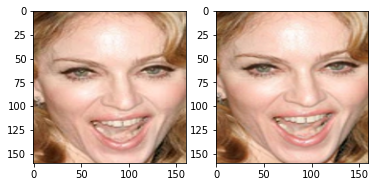

<Figure size 432x288 with 0 Axes>

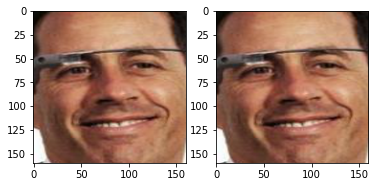

<Figure size 432x288 with 0 Axes>

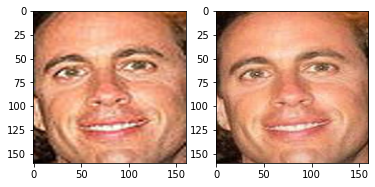

<Figure size 432x288 with 0 Axes>

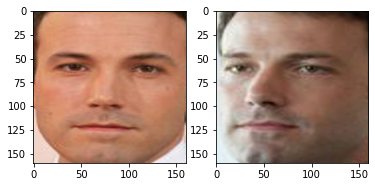

<Figure size 432x288 with 0 Axes>

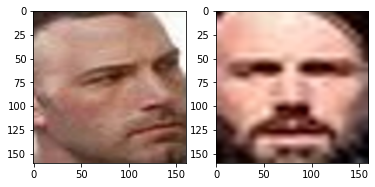

<Figure size 432x288 with 0 Axes>

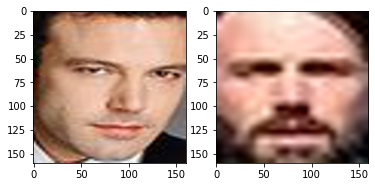

<Figure size 432x288 with 0 Axes>

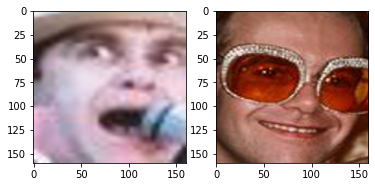

<Figure size 432x288 with 0 Axes>

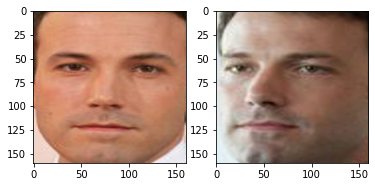

<Figure size 432x288 with 0 Axes>

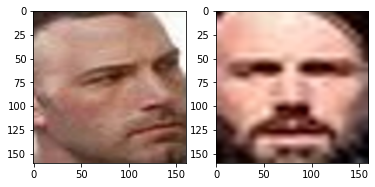

<Figure size 432x288 with 0 Axes>

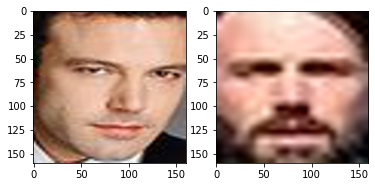

<Figure size 432x288 with 0 Axes>

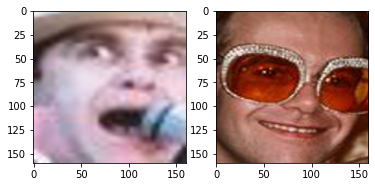

<Figure size 432x288 with 0 Axes>

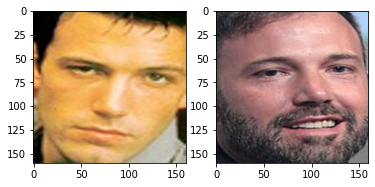

<Figure size 432x288 with 0 Axes>

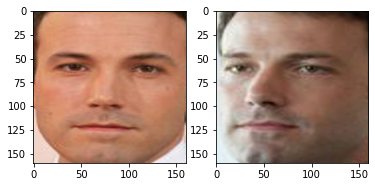

In [44]:
count = 0
trainX2_formats = list()
for face in normed_trainX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    trainX2_formats.append(new_emb)
    count += 1

count = 0
testX2_formats = list()
for face in normed_testX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    testX2_formats.append(new_emb)
    count += 1 

# new_emb = [0.42, -0.11, ..., 0], [1.22, -2.11, ..., 24] 
# OBS: - the last number in the array (new_emb) is the index of the img in their raw dataset (the img dataset)

formats_first_iteration = metric_obtention(trainX2_formats)

print("---------------------")


print(formats_first_iteration[-1])
print(formats_first_iteration[-2])
    
face_pairs_plot(formats_first_iteration, raw_trainX, 10)

print("EXAMPLE PLOT")

formats_second_iteration = metric_obtention(testX2_formats)

print("---------------------")


print(formats_second_iteration[-1])
print(formats_second_iteration[-2])
    
face_pairs_plot(formats_second_iteration, raw_trainX, 10)

print("EXAMPLE PLOT")

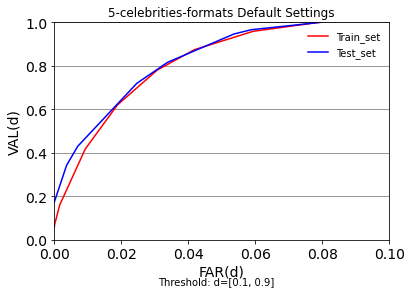

In [45]:
x_formats = formats_first_iteration[-1]
y_formats = formats_first_iteration[-2]
u_formats = formats_second_iteration[-1]
v_formats = formats_second_iteration[-2]

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
#ax.xaxis.set_ticks_position('top')
plt.title('5-celebrities-formats Default Settings')
plt.suptitle('Threshold: d=[0.1, 0.9]',fontsize=10, y=0)
ax.yaxis.grid(linestyle = '-', color = 'gray')
plt.xticks(fontsize=14,fontweight='normal')
plt.yticks(fontsize=14,fontweight='normal')
plt.xlabel('FAR(d)', fontsize=14)
plt.ylabel('VAL(d)', fontsize=14)
plt.xlim(0,0.1)
plt.ylim(0,1)
#ax.invert_xaxis()
ax.plot(x_formats, y_formats, 'g-', linewidth = 1.5, color='red', label='Train_set')
ax.plot(u_formats, v_formats, 'g-', linewidth = 1.5, color='blue', label='Test_set')
ax.legend(loc='upper right', frameon=False)
plt.savefig('Resultados/5-celebrities-formats Default Settings.png')
plt.show()

# 5-celebrities Formats MaxPooling

In [46]:
from sklearn.preprocessing import Normalizer, LabelEncoder

# 1) Load dataset
data = np.load("embeddings/format/train/maxpool_5_celebs_format_norm.npz")
trainX, trainy, testX, testy = data["arr_0"], data["arr_1"], data["arr_2"], data["arr_3"]
print("Dataset: train=%d, test=%d" % (trainX.shape[0], testX.shape[0]))

# 2) Normalize input vectors
in_encoder = Normalizer(norm = "l2")
#print(trainX[0]) # Embedding without normalization
normed_trainX = in_encoder.transform(trainX)
#print(trainX[0]) # Embedding with normalization
normed_testX = in_encoder.transform(testX)

# 3) Label encode targets
out_encoder = LabelEncoder()
#print(trainy)
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)
#print(trainy)
testy = out_encoder.transform(testy)

Dataset: train=100, test=26


Pairs: 4950
Psame: 3062
Pdiff: 41488
VAL para threshold:0.1es0.047028086218158065
FAR para threshold:0.1es0.0
VAL para threshold:0.2es0.06792945787067277
FAR para threshold:0.2es0.0001928268414963363
VAL para threshold:0.30000000000000004es0.1845199216198563
FAR para threshold:0.30000000000000004es0.002651369070574624
VAL para threshold:0.4es0.4392553886348792
FAR para threshold:0.4es0.012051677593521017
VAL para threshold:0.5es0.6319399085564991
FAR para threshold:0.5es0.02342846124180486
VAL para threshold:0.6es0.7769431743958197
FAR para threshold:0.6es0.03680582337061319
VAL para threshold:0.7000000000000001es0.8954931417374266
FAR para threshold:0.7000000000000001es0.054304859236405705
VAL para threshold:0.8es0.969301110385369
FAR para threshold:0.8es0.07337061318935596
VAL para threshold:0.9es1.0
FAR para threshold:0.9es0.09149633629001157
---------------------
[0.0, 0.0001928268414963363, 0.002651369070574624, 0.012051677593521017, 0.02342846124180486, 0.03680582337061319, 0.054

C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\ipykernel_launcher.py:87: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\ipykernel_launcher.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


EXAMPLE PLOT


<Figure size 432x288 with 0 Axes>

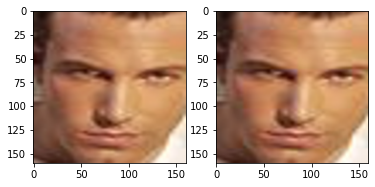

<Figure size 432x288 with 0 Axes>

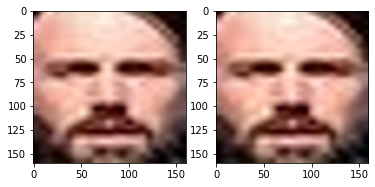

<Figure size 432x288 with 0 Axes>

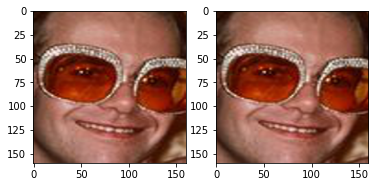

<Figure size 432x288 with 0 Axes>

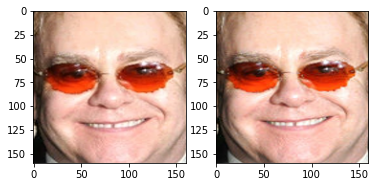

<Figure size 432x288 with 0 Axes>

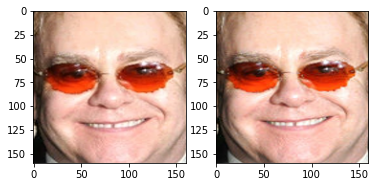

<Figure size 432x288 with 0 Axes>

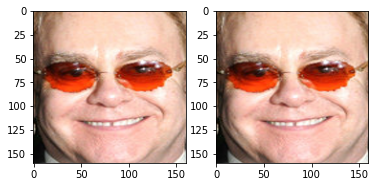

<Figure size 432x288 with 0 Axes>

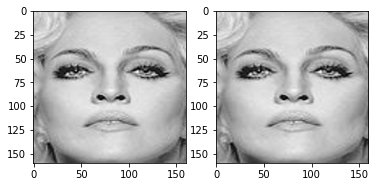

<Figure size 432x288 with 0 Axes>

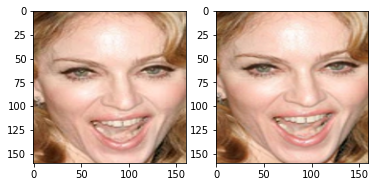

<Figure size 432x288 with 0 Axes>

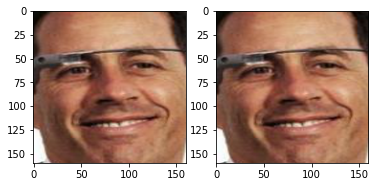

<Figure size 432x288 with 0 Axes>

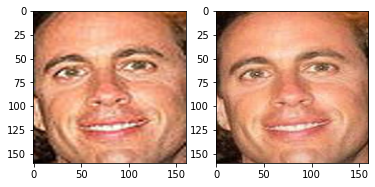

<Figure size 432x288 with 0 Axes>

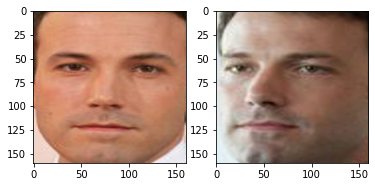

<Figure size 432x288 with 0 Axes>

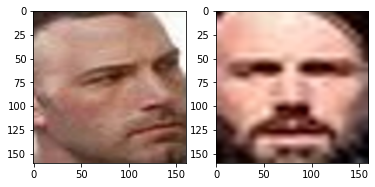

<Figure size 432x288 with 0 Axes>

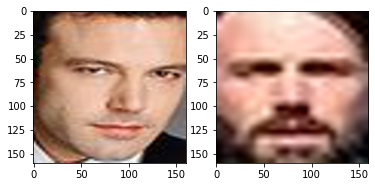

<Figure size 432x288 with 0 Axes>

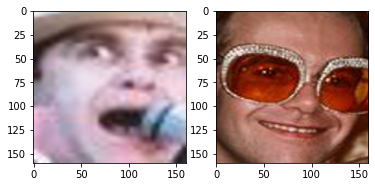

<Figure size 432x288 with 0 Axes>

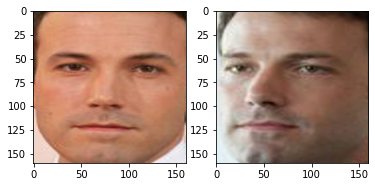

<Figure size 432x288 with 0 Axes>

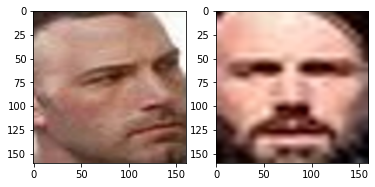

<Figure size 432x288 with 0 Axes>

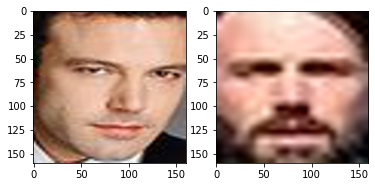

<Figure size 432x288 with 0 Axes>

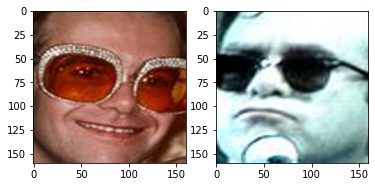

<Figure size 432x288 with 0 Axes>

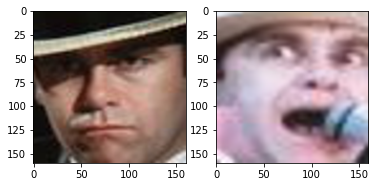

<Figure size 432x288 with 0 Axes>

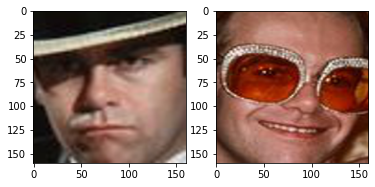

In [47]:
count = 0
trainX2_formats_max = list()
for face in normed_trainX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    trainX2_formats_max.append(new_emb)
    count += 1

count = 0
testX2_formats_max = list()
for face in normed_testX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    testX2_formats_max.append(new_emb)
    count += 1 

# new_emb = [0.42, -0.11, ..., 0], [1.22, -2.11, ..., 24] 
# OBS: - the last number in the array (new_emb) is the index of the img in their raw dataset (the img dataset)

max_formats_first_iteration = metric_obtention(trainX2_formats_max)

print("---------------------")


print(max_formats_first_iteration[-1])
print(max_formats_first_iteration[-2])
    
face_pairs_plot(max_formats_first_iteration, raw_trainX, 10)

print("EXAMPLE PLOT")

max_formats_second_iteration = metric_obtention(testX2_formats_max)

print("---------------------")


print(max_formats_second_iteration[-1])
print(max_formats_second_iteration[-2])
    
face_pairs_plot(max_formats_second_iteration, raw_trainX, 10)

print("EXAMPLE PLOT")

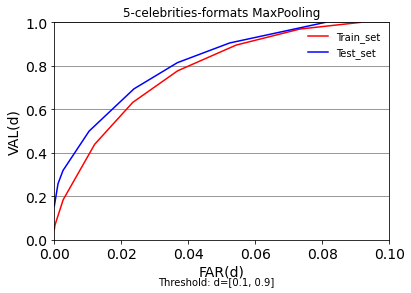

In [48]:
x_formats_max = max_formats_first_iteration[-1]
y_formats_max = max_formats_first_iteration[-2]
u_formats_max = max_formats_second_iteration[-1]
v_formats_max = max_formats_second_iteration[-2]

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
#ax.xaxis.set_ticks_position('top')
plt.title('5-celebrities-formats MaxPooling')
plt.suptitle('Threshold: d=[0.1, 0.9]',fontsize=10, y=0)
ax.yaxis.grid(linestyle = '-', color = 'gray')
plt.xticks(fontsize=14,fontweight='normal')
plt.yticks(fontsize=14,fontweight='normal')
plt.xlabel('FAR(d)', fontsize=14)
plt.ylabel('VAL(d)', fontsize=14)
plt.xlim(0,0.1)
plt.ylim(0,1)
#ax.invert_xaxis()
ax.plot(x_formats_max, y_formats_max, 'g-', linewidth = 1.5, color='red', label='Train_set')
ax.plot(u_formats_max, v_formats_max, 'g-', linewidth = 1.5, color='blue', label='Test_set')
ax.legend(loc='upper right', frameon=False)
plt.savefig('Resultados/5-celebrities-formats MaxPoolling.png')
plt.show()

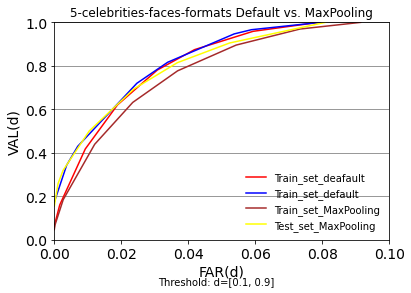

In [49]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
#ax.xaxis.set_ticks_position('top')
plt.title('5-celebrities-faces-formats Default vs. MaxPooling')
plt.suptitle('Threshold: d=[0.1, 0.9]',fontsize=10, y=0)
ax.yaxis.grid(linestyle = '-', color = 'gray')
plt.xticks(fontsize=14,fontweight='normal')
plt.yticks(fontsize=14,fontweight='normal')
plt.xlabel('FAR(d)', fontsize=14)
plt.ylabel('VAL(d)', fontsize=14)
plt.xlim(0,0.1)
plt.ylim(0,1)
#ax.invert_xaxis()
ax.plot(x_formats, y_formats, 'g-', linewidth = 1.5, color='red', label='Train_set_deafault')
ax.plot(u_formats, v_formats, 'g-', linewidth = 1.5, color='blue', label='Train_set_default')
ax.plot(x_formats_max, y_formats_max, 'g-', linewidth = 1.5, color='brown', label='Train_set_MaxPooling')
ax.plot(u_formats_max, v_formats_max, 'g-', linewidth = 1.5, color='yellow', label='Test_set_MaxPooling')
ax.legend(loc='lower right', frameon=False)
plt.savefig('Resultados/5-celebrities-faces-formats Default vs MaxPooling.png')
plt.show()

# Custom-LFW Default Settings

In [50]:
# Load dataset/model

data = np.load("custom_lfw_jostel_4.npz")

raw_trainX, raw_trainy, raw_testX, raw_testy = data["arr_0"], data["arr_1"], data["arr_2"], data["arr_3"]
print("Loaded: ", raw_trainX.shape, raw_trainy.shape, raw_testX.shape, raw_testy.shape)

path_to_model = "keras-facenet/model/facenet_keras.h5"
model = load_model(path_to_model)

Loaded:  (594, 160, 160, 3) (594,) (175, 160, 160, 3) (175,)


C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\keras\engine\saving.py:341: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [51]:
from sklearn.preprocessing import Normalizer, LabelEncoder

# 1) Load dataset
data = np.load("embeddings/lfw/train/default_custom_lfw_jostel_4_norm.npz")
trainX, trainy, testX, testy = data["arr_0"], data["arr_1"], data["arr_2"], data["arr_3"]
print("Dataset: train=%d, test=%d" % (trainX.shape[0], testX.shape[0]))

# 2) Normalize input vectors
in_encoder = Normalizer(norm = "l2")
#print(trainX[0]) # Embedding without normalization
normed_trainX = in_encoder.transform(trainX)
#print(trainX[0]) # Embedding with normalization
normed_testX = in_encoder.transform(testX)

# 3) Label encode targets
out_encoder = LabelEncoder()
#print(trainy)
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)
#print(trainy)
testy = out_encoder.transform(testy)

Dataset: train=594, test=175


Pairs: 176121
Psame: 11682
Pdiff: 1573407
VAL para threshold:0.1es0.0007704160246533128
FAR para threshold:0.1es0.0
VAL para threshold:0.2es0.06445814072932717
FAR para threshold:0.2es5.9107401962747086e-05
VAL para threshold:0.30000000000000004es0.2226502311248074
FAR para threshold:0.30000000000000004es0.0003946849098802789
VAL para threshold:0.4es0.4465844889573703
FAR para threshold:0.4es0.0012260019181305282
VAL para threshold:0.5es0.6528847800034241
FAR para threshold:0.5es0.0024513682727990913
VAL para threshold:0.6es0.8121040917651087
FAR para threshold:0.6es0.003929053321867769
VAL para threshold:0.7000000000000001es0.9060948467728128
FAR para threshold:0.7000000000000001es0.005324750684342958
VAL para threshold:0.8es0.9673857216230097
FAR para threshold:0.8es0.0069174727200273034
VAL para threshold:0.9es1.0
FAR para threshold:0.9es0.008854670152096691
---------------------
[0.0, 5.9107401962747086e-05, 0.0003946849098802789, 0.0012260019181305282, 0.0024513682727990913, 0.003

C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\ipykernel_launcher.py:87: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\ipykernel_launcher.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


EXAMPLE PLOT


<Figure size 432x288 with 0 Axes>

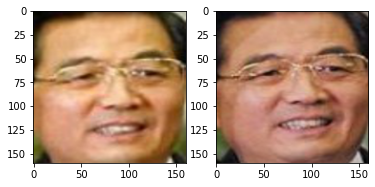

<Figure size 432x288 with 0 Axes>

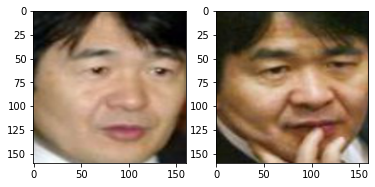

<Figure size 432x288 with 0 Axes>

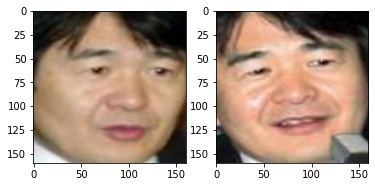

<Figure size 432x288 with 0 Axes>

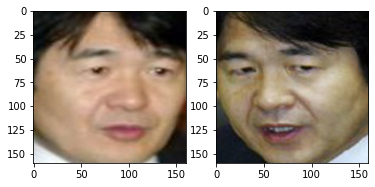

<Figure size 432x288 with 0 Axes>

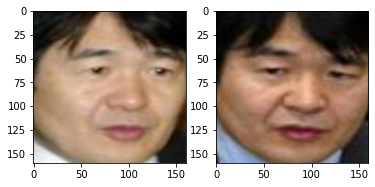

<Figure size 432x288 with 0 Axes>

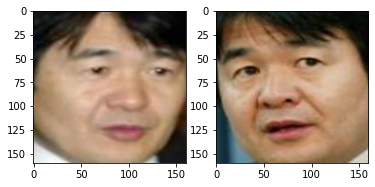

<Figure size 432x288 with 0 Axes>

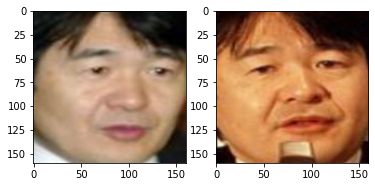

<Figure size 432x288 with 0 Axes>

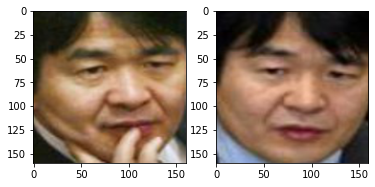

<Figure size 432x288 with 0 Axes>

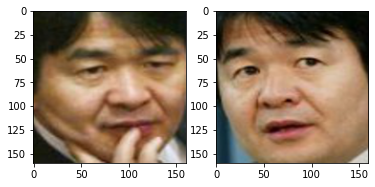

<Figure size 432x288 with 0 Axes>

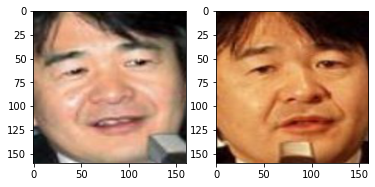

<Figure size 432x288 with 0 Axes>

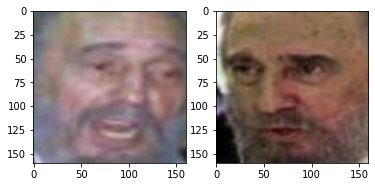

<Figure size 432x288 with 0 Axes>

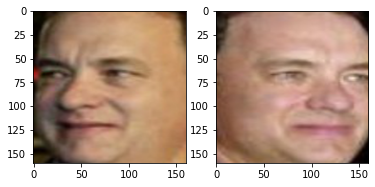

<Figure size 432x288 with 0 Axes>

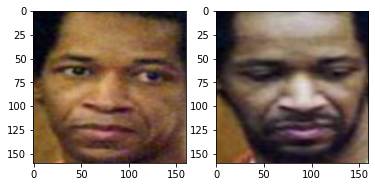

<Figure size 432x288 with 0 Axes>

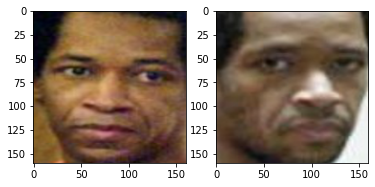

<Figure size 432x288 with 0 Axes>

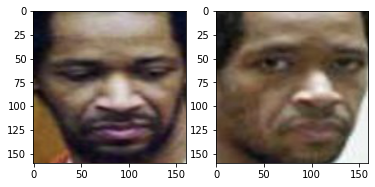

<Figure size 432x288 with 0 Axes>

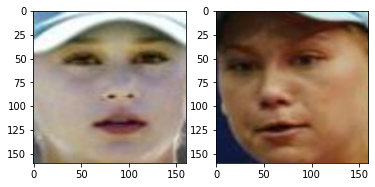

<Figure size 432x288 with 0 Axes>

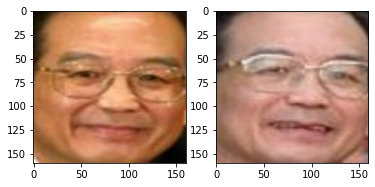

<Figure size 432x288 with 0 Axes>

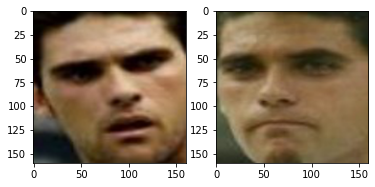

<Figure size 432x288 with 0 Axes>

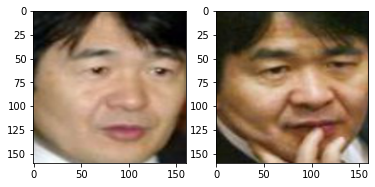

<Figure size 432x288 with 0 Axes>

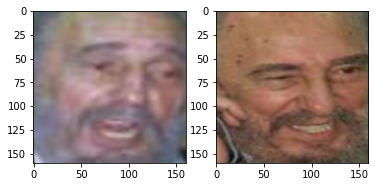

In [52]:
count = 0
trainX2_lfw = list()
for face in normed_trainX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    trainX2_lfw.append(new_emb)
    count += 1

count = 0
testX2_lfw = list()
for face in normed_testX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    testX2_lfw.append(new_emb)
    count += 1 

# new_emb = [0.42, -0.11, ..., 0], [1.22, -2.11, ..., 24] 
# OBS: - the last number in the array (new_emb) is the index of the img in their raw dataset (the img dataset)

lfw_first_iteration = metric_obtention(trainX2_lfw)

print("---------------------")


print(lfw_first_iteration[-1])
print(lfw_first_iteration[-2])
    
face_pairs_plot(lfw_first_iteration, raw_trainX, 10)

print("EXAMPLE PLOT")

lfw_second_iteration = metric_obtention(testX2_lfw)

print("---------------------")


print(lfw_second_iteration[-1])
print(lfw_second_iteration[-2])
    
face_pairs_plot(lfw_second_iteration, raw_trainX, 10)

print("EXAMPLE PLOT")

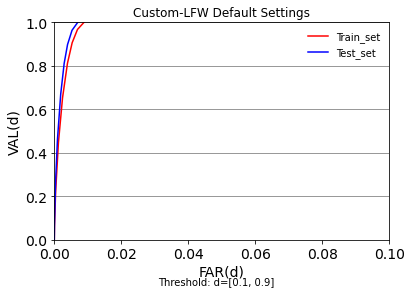

In [54]:
x_lfw = lfw_first_iteration[-1]
y_lfw = lfw_first_iteration[-2]
u_lfw = lfw_second_iteration[-1]
v_lfw = lfw_second_iteration[-2]

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
#ax.xaxis.set_ticks_position('top')
plt.title('Custom-LFW Default Settings')
plt.suptitle('Threshold: d=[0.1, 0.9]',fontsize=10, y=0)
ax.yaxis.grid(linestyle = '-', color = 'gray')
plt.xticks(fontsize=14,fontweight='normal')
plt.yticks(fontsize=14,fontweight='normal')
plt.xlabel('FAR(d)', fontsize=14)
plt.ylabel('VAL(d)', fontsize=14)
plt.xlim(0,0.1)
plt.ylim(0,1)
#ax.invert_xaxis()
ax.plot(x_lfw, y_lfw, 'g-', linewidth = 1.5, color='red', label='Train_set')
ax.plot(u_lfw, v_lfw, 'g-', linewidth = 1.5, color='blue', label='Test_set')
ax.legend(loc='upper right', frameon=False)
plt.savefig('Resultados/Custom-LFW Default Settings1.png')
plt.show()

# Custom-LFW MaxPooling

In [55]:
from sklearn.preprocessing import Normalizer, LabelEncoder

# 1) Load dataset
data = np.load("embeddings/lfw/train/maxpool_custom_lfw_jostel_4_norm.npz")
trainX, trainy, testX, testy = data["arr_0"], data["arr_1"], data["arr_2"], data["arr_3"]
print("Dataset: train=%d, test=%d" % (trainX.shape[0], testX.shape[0]))

# 2) Normalize input vectors
in_encoder = Normalizer(norm = "l2")
#print(trainX[0]) # Embedding without normalization
normed_trainX = in_encoder.transform(trainX)
#print(trainX[0]) # Embedding with normalization
normed_testX = in_encoder.transform(testX)

# 3) Label encode targets
out_encoder = LabelEncoder()
#print(trainy)
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)
#print(trainy)
testy = out_encoder.transform(testy)

Dataset: train=594, test=175


Pairs: 176121
Psame: 11682
Pdiff: 1573407
VAL para threshold:0.1es0.0007704160246533128
FAR para threshold:0.1es0.0
VAL para threshold:0.2es0.06445814072932717
FAR para threshold:0.2es5.9107401962747086e-05
VAL para threshold:0.30000000000000004es0.2226502311248074
FAR para threshold:0.30000000000000004es0.0003946849098802789
VAL para threshold:0.4es0.4465844889573703
FAR para threshold:0.4es0.0012260019181305282
VAL para threshold:0.5es0.6528847800034241
FAR para threshold:0.5es0.0024513682727990913
VAL para threshold:0.6es0.8121040917651087
FAR para threshold:0.6es0.003929053321867769
VAL para threshold:0.7000000000000001es0.9060948467728128
FAR para threshold:0.7000000000000001es0.005324750684342958
VAL para threshold:0.8es0.9673857216230097
FAR para threshold:0.8es0.0069174727200273034
VAL para threshold:0.9es1.0
FAR para threshold:0.9es0.008854670152096691
---------------------
[0.0, 5.9107401962747086e-05, 0.0003946849098802789, 0.0012260019181305282, 0.0024513682727990913, 0.003

C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\ipykernel_launcher.py:87: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\lenovo\Anaconda3\envs\PythonCPU\lib\site-packages\ipykernel_launcher.py:88: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


EXAMPLE PLOT


<Figure size 432x288 with 0 Axes>

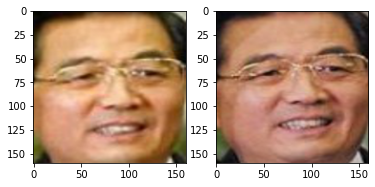

<Figure size 432x288 with 0 Axes>

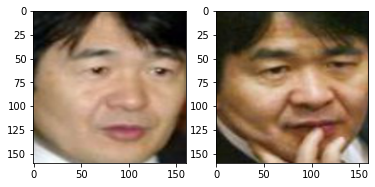

<Figure size 432x288 with 0 Axes>

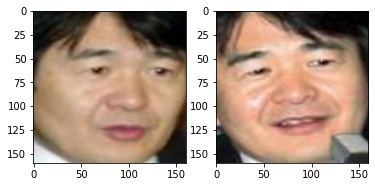

<Figure size 432x288 with 0 Axes>

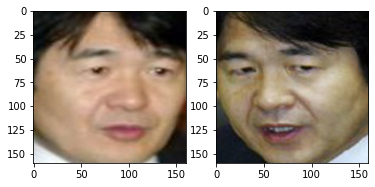

<Figure size 432x288 with 0 Axes>

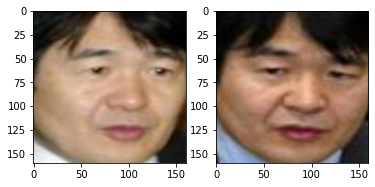

<Figure size 432x288 with 0 Axes>

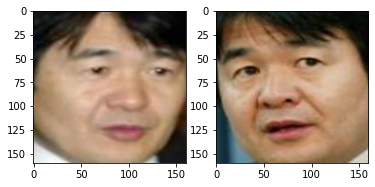

<Figure size 432x288 with 0 Axes>

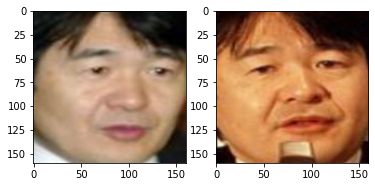

<Figure size 432x288 with 0 Axes>

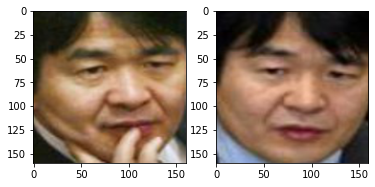

<Figure size 432x288 with 0 Axes>

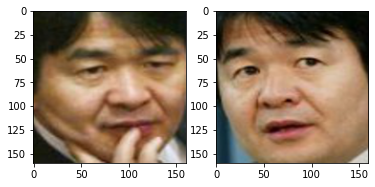

<Figure size 432x288 with 0 Axes>

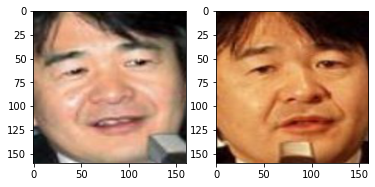

<Figure size 432x288 with 0 Axes>

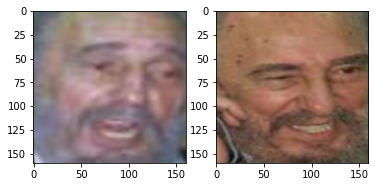

<Figure size 432x288 with 0 Axes>

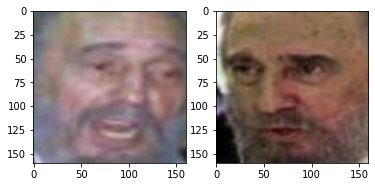

<Figure size 432x288 with 0 Axes>

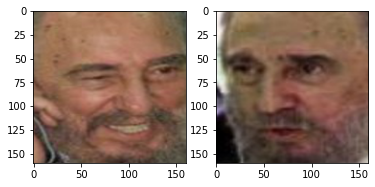

<Figure size 432x288 with 0 Axes>

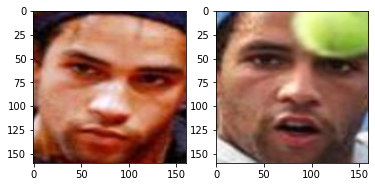

<Figure size 432x288 with 0 Axes>

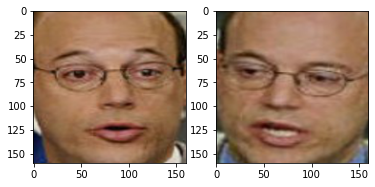

<Figure size 432x288 with 0 Axes>

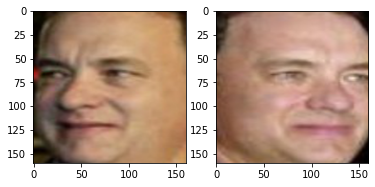

<Figure size 432x288 with 0 Axes>

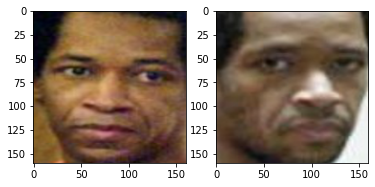

<Figure size 432x288 with 0 Axes>

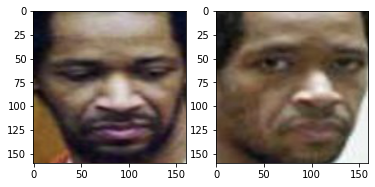

<Figure size 432x288 with 0 Axes>

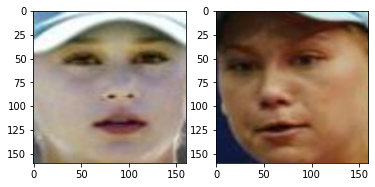

<Figure size 432x288 with 0 Axes>

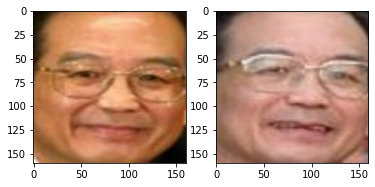

In [56]:
count = 0
trainX2_lfw_max = list()
for face in normed_trainX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    trainX2_lfw_max.append(new_emb)
    count += 1

count = 0
testX2_lfw_max = list()
for face in normed_testX:
    new_emb = face
    new_emb = np.append(new_emb, count)
    testX2_lfw_max.append(new_emb)
    count += 1 

# new_emb = [0.42, -0.11, ..., 0], [1.22, -2.11, ..., 24] 
# OBS: - the last number in the array (new_emb) is the index of the img in their raw dataset (the img dataset)

lfw_max_first_iteration = metric_obtention(trainX2_lfw)

print("---------------------")


print(lfw_first_iteration[-1])
print(lfw_first_iteration[-2])
    
face_pairs_plot(lfw_max_first_iteration, raw_trainX, 10)

print("EXAMPLE PLOT")

lfw_max_second_iteration = metric_obtention(testX2_lfw_max)

print("---------------------")


print(lfw_max_second_iteration[-1])
print(lfw_max_second_iteration[-2])
    
face_pairs_plot(lfw_max_second_iteration, raw_trainX, 10)

print("EXAMPLE PLOT")

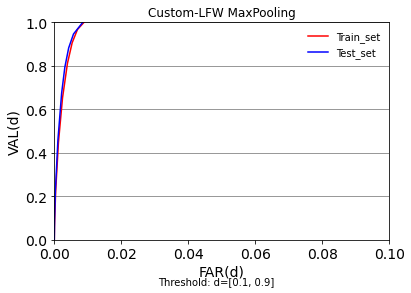

In [57]:
x_lfw_max = lfw_max_first_iteration[-1]
y_lfw_max = lfw_max_first_iteration[-2]
u_lfw_max = lfw_max_second_iteration[-1]
v_lfw_max = lfw_max_second_iteration[-2]

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
#ax.xaxis.set_ticks_position('top')
plt.title('Custom-LFW MaxPooling')
plt.suptitle('Threshold: d=[0.1, 0.9]',fontsize=10, y=0)
ax.yaxis.grid(linestyle = '-', color = 'gray')
plt.xticks(fontsize=14,fontweight='normal')
plt.yticks(fontsize=14,fontweight='normal')
plt.xlabel('FAR(d)', fontsize=14)
plt.ylabel('VAL(d)', fontsize=14)
plt.xlim(0,0.1)
plt.ylim(0,1)
#ax.invert_xaxis()
ax.plot(x_lfw_max, y_lfw_max, 'g-', linewidth = 1.5, color='red', label='Train_set')
ax.plot(u_lfw_max, v_lfw_max, 'g-', linewidth = 1.5, color='blue', label='Test_set')
ax.legend(loc='upper right', frameon=False)
plt.savefig('Resultados/Custom-LFW MaxPooling1.png')
plt.show()

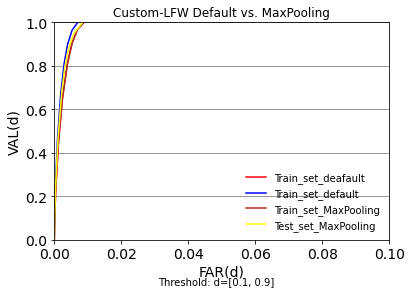

In [58]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
#ax.xaxis.set_ticks_position('top')
plt.title('Custom-LFW Default vs. MaxPooling')
plt.suptitle('Threshold: d=[0.1, 0.9]',fontsize=10, y=0)
ax.yaxis.grid(linestyle = '-', color = 'gray')
plt.xticks(fontsize=14,fontweight='normal')
plt.yticks(fontsize=14,fontweight='normal')
plt.xlabel('FAR(d)', fontsize=14)
plt.ylabel('VAL(d)', fontsize=14)
plt.xlim(0,0.1)
plt.ylim(0,1)
#ax.invert_xaxis()
ax.plot(x_lfw, y_lfw, 'g-', linewidth = 1.5, color='red', label='Train_set_deafault')
ax.plot(u_lfw, v_lfw, 'g-', linewidth = 1.5, color='blue', label='Train_set_default')
ax.plot(x_lfw_max, y_lfw_max, 'g-', linewidth = 1.5, color='brown', label='Train_set_MaxPooling')
ax.plot(u_lfw_max, v_lfw_max, 'g-', linewidth = 1.5, color='yellow', label='Test_set_MaxPooling')
ax.legend(loc='lower right', frameon=False)
plt.savefig('Resultados/Custom-LFW Default vs MaxPooling1.png')
plt.show()

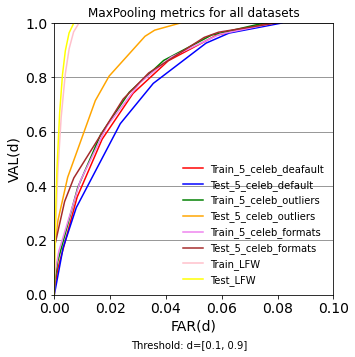

In [59]:
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(1, 1, 1)
#ax.xaxis.set_ticks_position('top')
plt.title('MaxPooling metrics for all datasets')
plt.suptitle('Threshold: d=[0.1, 0.9]',fontsize=10, y=0)
ax.yaxis.grid(linestyle = '-', color = 'gray')
plt.xticks(fontsize=14,fontweight='normal')
plt.yticks(fontsize=14,fontweight='normal')
plt.xlabel('FAR(d)', fontsize=14)
plt.ylabel('VAL(d)', fontsize=14)
plt.xlim(0,0.1)
plt.ylim(0,1)
#ax.invert_xaxis()
ax.plot(x, y, 'g-', linewidth = 1.5, color='red', label='Train_5_celeb_deafault')
ax.plot(u, v, 'g-', linewidth = 1.5, color='blue', label='Test_5_celeb_default')
ax.plot(x_outl, y_outl, 'g-', linewidth = 1.5, color='green', label='Train_5_celeb_outliers')
ax.plot(u_outl, v_outl, 'g-', linewidth = 1.5, color='orange', label='Test_5_celeb_outliers')
ax.plot(x_formats, y_formats, 'g-', linewidth = 1.5, color='violet', label='Train_5_celeb_formats')
ax.plot(u_formats, v_formats, 'g-', linewidth = 1.5, color='brown', label='Test_5_celeb_formats')
ax.plot(x_lfw, y_lfw, 'g-', linewidth = 1.5, color='pink', label='Train_LFW')
ax.plot(u_lfw, v_lfw, 'g-', linewidth = 1.5, color='yellow', label='Test_LFW')
ax.legend(loc='lower right', frameon=False)
plt.savefig('Resultados/Max_Pooling_all_datasets.png')
plt.show()

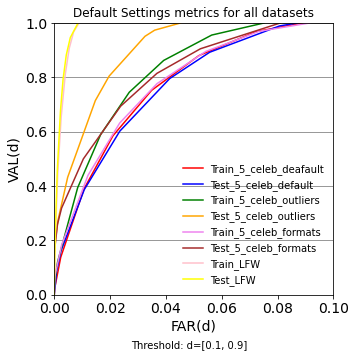

In [60]:
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(1, 1, 1)
#ax.xaxis.set_ticks_position('top')
plt.title('Default Settings metrics for all datasets')
plt.suptitle('Threshold: d=[0.1, 0.9]',fontsize=10, y=0)
ax.yaxis.grid(linestyle = '-', color = 'gray')
plt.xticks(fontsize=14,fontweight='normal')
plt.yticks(fontsize=14,fontweight='normal')
plt.xlabel('FAR(d)', fontsize=14)
plt.ylabel('VAL(d)', fontsize=14)
plt.xlim(0,0.1)
plt.ylim(0,1)
#ax.invert_xaxis()
ax.plot(x_max, y_max, 'g-', linewidth = 1.5, color='red', label='Train_5_celeb_deafault')
ax.plot(u_max, v_max, 'g-', linewidth = 1.5, color='blue', label='Test_5_celeb_default')
ax.plot(x_outl_max, y_outl_max, 'g-', linewidth = 1.5, color='green', label='Train_5_celeb_outliers')
ax.plot(u_outl_max, v_outl_max, 'g-', linewidth = 1.5, color='orange', label='Test_5_celeb_outliers')
ax.plot(x_formats_max, y_formats_max, 'g-', linewidth = 1.5, color='violet', label='Train_5_celeb_formats')
ax.plot(u_formats_max, v_formats_max, 'g-', linewidth = 1.5, color='brown', label='Test_5_celeb_formats')
ax.plot(x_lfw_max, y_lfw_max, 'g-', linewidth = 1.5, color='pink', label='Train_LFW')
ax.plot(u_lfw_max, v_lfw_max, 'g-', linewidth = 1.5, color='yellow', label='Test_LFW')
ax.legend(loc='lower right', frameon=False)
plt.savefig('Resultados/Default_Settings_all_datasets.png')
plt.show()